In [3]:
include("../../datatools.jl")

stack_all_streets

In [4]:
using LinearAlgebra, Plots, CSV, DataFrames, Optim

In [5]:
all_dfs = get_all_dataframes()

Dict{Any, Any} with 6 entries:
  "Gale/West"   => Any[1011×11 DataFrame…
  "Gale/East"   => Any[1383×11 DataFrame…
  "Museum"      => Any[1404×11 DataFrame…
  "Center/West" => Any[1029×11 DataFrame…
  "Sweetwater"  => Any[790×11 DataFrame…
  "Center/East" => Any[976×11 DataFrame…

In [6]:
gedf = all_dfs["Gale/East"];

In [7]:
gedf = stack_df_vectors(gedf);

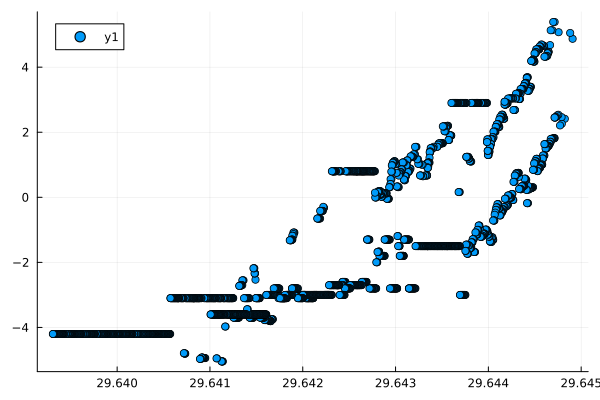

In [8]:
scatter(gedf.latitude, gedf.altitude)

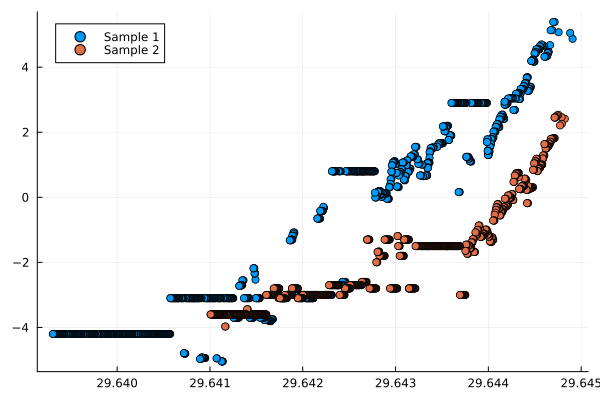

In [9]:
scatter(gedf.latitude, gedf.altitude, group=gedf.sample)

In [10]:
df = stack_all_streets(all_dfs);

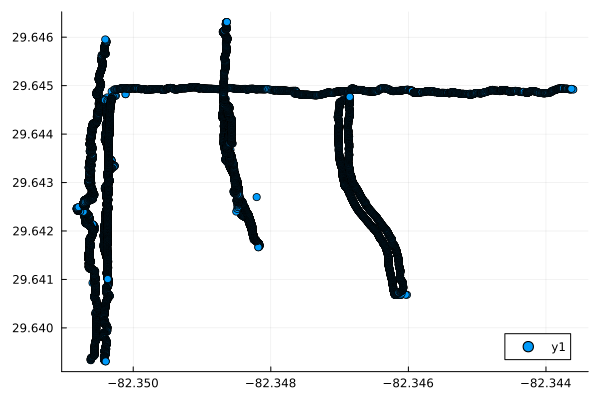

In [11]:
scatter(df.longitude, df.latitude)

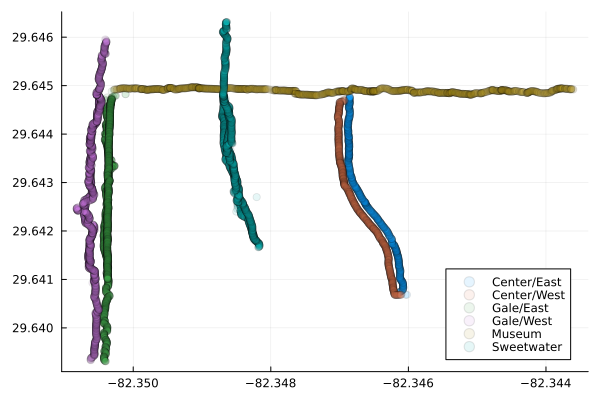

In [13]:
plt = scatter(df.longitude, df.latitude, group=df.street, ma=0.1)

In [15]:
function fit_model_to_data(xs, ys, model_func, initial_params; n=100)
     #scale the x-values
     scaled_xs = @. (xs - 29.6) * 100
     
     # get training samples
     train_xs, train_ys = get_spaced_nodes(scaled_xs, ys, n)


     # setup cost/loss function
     function loss(params)
          predicted_y = model_func(train_xs, params...)
          return sum((train_ys - predicted_y) .^ 2)
     end

     # optimize the loss function
     opt_res = optimize(loss, initial_params)
     opt_params = Optim.minimizer(opt_res)

     # fit data
     fitted_ys = model_func(scaled_xs, opt_params...)

     # sort so points returned are in increasing latitudes (for plotting)
     temp = DataFrame(x=xs, y = fitted_ys)
     sort!(temp, :x)

     return temp.x, temp.y
end

fit_model_to_data (generic function with 1 method)

In [16]:
# test functions

function gompertz(x, a, b, c, d)
     e = exp(1)
     return @. (a * e^(b*e^(-c*x)) + d)
end

function expo(xs, a, b, c)
     return  @. a * exp(b * xs) + c 
end

function sigmoid(x, a, b, c)
     res = @. c / (1.0 + exp(-a * (x-b)))
     return res
end

sigmoid (generic function with 1 method)

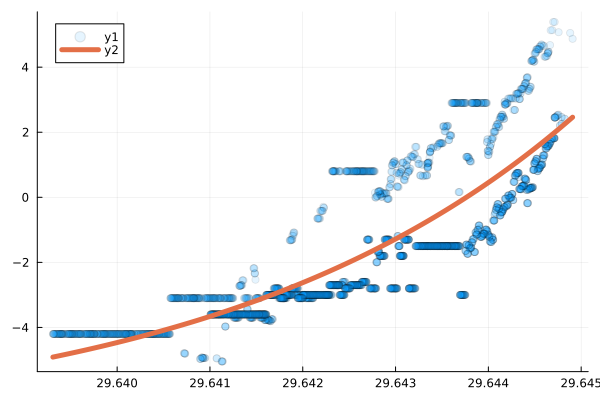

In [17]:
xs = gedf.latitude;
ys = gedf.altitude;

ft = fit_model_to_data(xs, ys, expo, [2.0, 1.0, -4.0])

scatter(xs, ys, ma=0.1)
plot!(ft, lw=5)

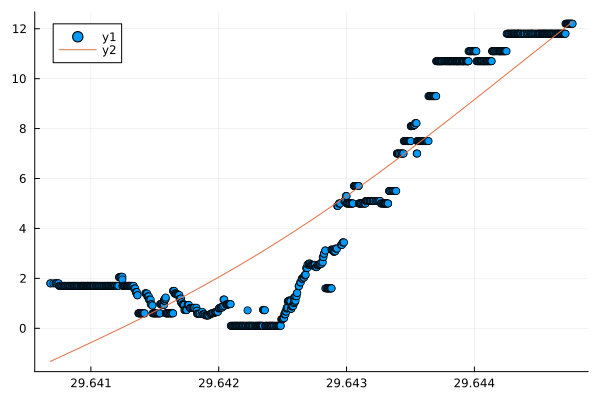

In [18]:
cedf = stack_df_vectors(all_dfs["Center/East"]);

xs = cedf.latitude;
ys = cedf.altitude;

scatter(xs, ys)

f(x, a, b, c) = @. a*x + sin(x/b) + c

ft = fit_model_to_data(xs, ys, f, [12.0, 12.0, -4]; n=200)

plot!(ft)

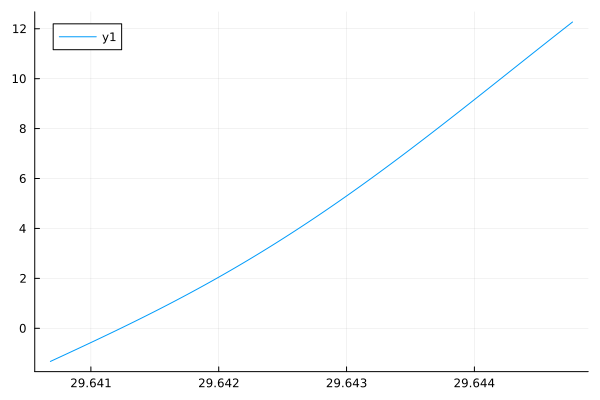

In [19]:
plot(ft)

---
---

### Ridge Regression Take 2

Original Function:

In [20]:
function ridge_regression_prediction(x_data, y_data, test_x, model_func, λ)

     # apply logistical transf.
     xs = model_func.(x_data)
     
     # result of applying funciton to data
     # design matrix
     X = @. [xs^0 xs^1 xs^2 xs^3]

     # regularization matrix
     L = λ * I(size(X, 2))

     # ridge regression
     β = inv(X' * X + L) * X' * y_data

     # evaluate new data
     test_xs = model_func.(test_x)
     
     Xt = @. [test_xs^0 test_xs^1 test_xs^2 test_xs^3]
     
     y_pred = Xt * β

     return y_pred

end

ridge_regression_prediction (generic function with 1 method)

Take a generalized exponential function of the form
$$y = a e^{k x}$$

$$log(y) = log(a) + kx$$

Our y-values contain negatives. Are we able to just apply some offset to them and undo that at the end?


In [112]:
function ridge_regression_expo(x_data, y_data, test_x, λ)
     y_offset = abs(minimum(y_data)) + 1.0
     

     Y = log.(y_data .+ offset)
     
     # Correct design matrix construction
     X = hcat(ones(length(x_data)), x_data)
     
     # Regularization matrix with no regularization on intercept
     L = λ * I(size(X, 2))
     L[1, 1] = 0
     
     # Ridge regression solution
     θ = inv(X' * X + L) * X' * Y
     
     # Predicting on new data
     ln_y_pred = @. θ[1] + θ[2] .* test_x
     y_pred = exp.(ln_y_pred) .- offset  # Apply offset adjustment after exponentiation
     
     return test_x, y_pred
 end
 

ridge_regression_expo (generic function with 3 methods)

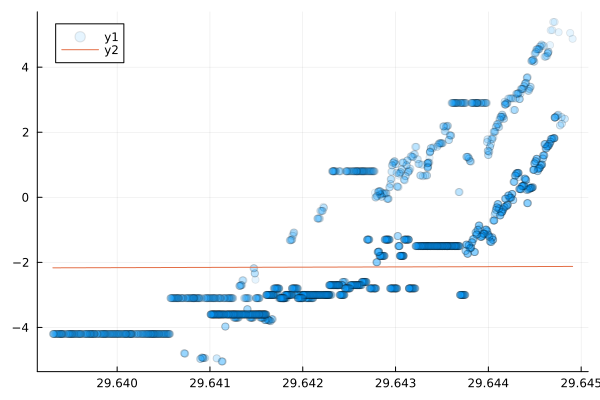

In [113]:
xs = gedf.latitude;
ys = gedf.altitude;



test_x = collect(range(minimum(xs), maximum(xs), 100));


ft = ridge_regression_expo(xs, ys, test_x, 1.0)

scatter(xs, ys, ma=0.1)
plot!(ft)

In [63]:
# function ridge_regression_expo(x, y, λ)
#      m = length(y)
     
#      # Linearize the model by taking the natural log of y
#      Y = log.(y)
     
#      # Construct the design matrix with a column of ones and x values
#      X = hcat(ones(m), x)
     
#      # Ridge Regression formula: (X'X + λI)^(-1)X'Y
#      # Where I is the identity matrix with the first element set to 0 (to exclude the intercept from regularization)
#      L = I(size(X, 2))
#      L[1, 1] = 0
#      θ = inv(X'X + λ * L) * X'Y
     
#      return θ
#  end

#  function predict(θ, x_new)
#     # Calculate ln(y_pred) for the new x values using the model's linear equation
#     ln_y_pred =@. θ[1] + θ[2] .* x_new
    
#     # Exponentiate to get y_pred in the original scale
#     y_pred = exp.(ln_y_pred)
    
#     return y_pred
# end


predict (generic function with 1 method)

In [56]:
x = [1, 2, 3, 4, 5]  # Example x values
y = [2.718, 7.389, 20.085, 54.598, 148.413]  # Example y values (e^x)
λ = 1.0  # Regularization parameter

θ = ridge_regression_expo(x, y, λ)

println("Model parameters: ")
println("ln(a) = ", θ[1])
println("b = ", θ[2])

Model parameters: 
ln(a) = 0.27264161552886074
b = 0.9091100062480285


In [61]:

 # Example: Predicting for new x values
 x_new = [2.5, 3.5, 4.5]  # New x values for which you want predictions
 y_pred = predict(θ, x)
 
 println("Predicted y values: ", y_pred)

Predicted y values: [3.2600796310309157, 8.09188435578389, 20.08496719041006, 49.85314783342194, 123.7411206769455]


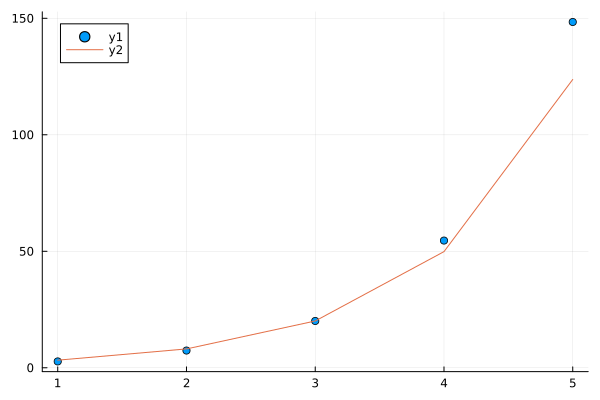

In [62]:
scatter(x, y)
plot!(x, y_pred)